In [101]:
import pandas as pd
import numpy as np

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
%matplotlib inline

In [105]:
df = pd.read_csv("ALARMS_CLEANED.csv")

In [107]:
df.head()

,Unnamed: 0,Unnamed: 1,13/01/2024,14/01/2025,15/01/2025,16/01/2025,17/01/2025,18/01/2025,19/01/2025,20/01/2025,21/01/2025,22/01/2025,23/01/2025,24/01/2025,25/01/2025,26/01/2025,Unnamed: 16
0,Room_Codes,Rooms,Count_13,Count_14,Count_15,Count_16,Count_17,Count_18,Count_19,Count_20,Count_21,Count_22,Count_23,Count_24,Count_25,Count_26,NaN
1,570ca,672376234e098298d5a570ca,18,26,30,14,5,14,0,0,0,0,0,0,0,0,NaN
2,570ce,672376234e098298d5a570ce,10,31,72,29,49,19,24,53,21,26,77,5,4,13,NaN
3,570cf,672376234e098298d5a570cf,37,21,32,25,19,0,0,7,26,19,17,14,9,10,NaN
4,570d0,672376234e098298d5a570d0,51,33,29,49,8,0,10,51,54,49,60,14,36,3,NaN


In [16]:
date_row = df.iloc[1, 3:].values

In [26]:
print("Extracted date row values:", date_row)

Extracted date row values: ['26' '30' '14' '5' '14' '0' '0' '0' '0' '0' '0' '0' '0' nan]


In [28]:
date_row = [str(x).strip() for x in date_row]

In [30]:
try:
    date_values = pd.to_datetime(date_row, errors="coerce")
    print("Successfully converted to datetime:", date_values)
except Exception as e:
    print("Error converting dates:", e)

Successfully converted to datetime: DatetimeIndex(['NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT', 'NaT',
               'NaT', 'NaT', 'NaT', 'NaT', 'NaT'],
              dtype='datetime64[ns]', freq=None)


C:\Users\ObaOriekwo\AppData\Local\Temp\ipykernel_33072\91500115.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  date_values = pd.to_datetime(date_row, errors="coerce")


In [32]:
date_values = date_values.dropna()

In [34]:
print("Final processed date values:", date_values)

Final processed date values: DatetimeIndex([], dtype='datetime64[ns]', freq=None)


In [36]:
df_cleaned = df.iloc[3:, :].copy()
df_cleaned.columns = df.iloc[2, :].tolist()
df_cleaned = df_cleaned.rename(columns={df_cleaned.columns[1]: "Room_Code"})
df_cleaned = df_cleaned.iloc[:, 1:].reset_index(drop=True)

In [38]:
num_data_columns = df_cleaned.shape[1] -1
date_values = date_values[:num_data_columns]

In [40]:
if len(df_cleaned.columns[1:]) == len(date_values):
    df_cleaned.columns = ["Room_Code"] + list(date_values)
else:
    print("Error: Column count mismatch.")
    print("Existing Columns:", df_cleaned.columns)
    print("Extracted Date Values:", date_values)

Error: Column count mismatch.
Existing Columns: Index(['Room_Code',        '10',        '31',        '72',        '29',
              '49',        '19',        '24',        '53',        '21',
              '26',        '77',         '5',         '4',        '13',
               nan],
      dtype='object')
Extracted Date Values: DatetimeIndex([], dtype='datetime64[ns]', freq=None)


In [42]:
print(df_cleaned.head())

                  Room_Code  10   31  72  29  49 19  24  53  21  26  77   5  \
0  672376234e098298d5a570cf  37   21  32  25  19  0   0   7  26  19  17  14   
1  672376234e098298d5a570d0  51   33  29  49   8  0  10  51  54  49  60  14   
2  672376234e098298d5a570d1  61   55  51  76  22  0   8  66  49  48  49  25   
3  672376234e098298d5a570d2  31   25  43   9  10  0   5  70  30  23   9  38   
4  672376234e098298d5a570d4  80  110   3   0   0  0   0   0   5  45  32  45   

    4  13  NaN  
0   9  10  NaN  
1  36   3  NaN  
2   7  13  NaN  
3  29  30  NaN  
4  40  26  NaN  


In [46]:
for col in df_cleaned.columns[1:]:
    df_cleaned[col] = pd.to_numeric(df_cleaned[col], errors="coerce")

In [48]:
zero_alarm_counts = (df_cleaned.iloc[:, 1:] == 0).sum(axis=1)
df_cleaned["Zero_Days"] = zero_alarm_counts
df_zero_alarm = df_cleaned[df_cleaned["Zero_Days"] > 1]

In [50]:
df_zero_alarm_filtered = df_zero_alarm.iloc[:, 1:-1]

In [52]:
average_alarm_per_day = df_zero_alarm_filtered.mean(axis=0, skipna=True).reset_index()
average_alarm_per_day.columns = ["Date", "Average_Alarm_Count"]

In [54]:
average_alarm_per_day = average_alarm_per_day.dropna(subset=["Date"])

In [56]:
fig = px.line(average_alarm_per_day, x="Date", y="Average_Alarm_Count", 
             title="Average Alarm Count Over Time (Rooms with Zero Alarms > 1 Day)", 
             labels={"Date": "Date", "Average_Alarm_Count": "Average Alarm Count"}, 
             markers=True)

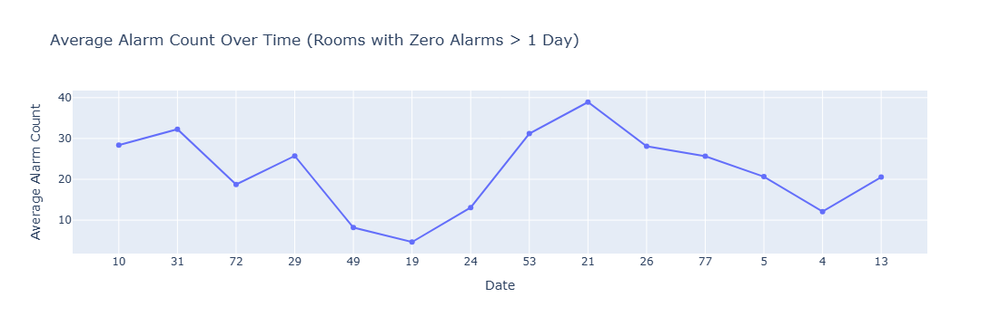

In [58]:
fig.show()

In [60]:
df_cleaned = df.iloc[3:, :].copy()
df_cleaned.columns = df.iloc[2, :].tolist()
df_cleaned = df_cleaned.rename(columns={df_cleaned.columns[1]: "Room_Code"})
df_cleaned = df_cleaned.iloc[:, 1:].reset_index(drop=True)

In [62]:
for col in df_cleaned.columns[1:]:
    df_cleaned[col] = pd.to_numeric(df_cleaned[col], errors="coerce")

In [66]:
df_cleaned["Total_Alarms"] = df_cleaned.iloc[:, 1:].sum(axis=1)

In [82]:
top_40_rooms = df_cleaned[["Room_Code", "Total_Alarms"]].dropna()

In [96]:
top_40_rooms["Room_Code"] = top_40_rooms["Room_Code"].astype(str)

In [86]:
print("Columns in top_40_rooms DataFrame:", top_40_rooms.columns)

Columns in top_40_rooms DataFrame: Index(['Room_Code', 'Total_Alarms'], dtype='object')


In [98]:
top_40_rooms = top_40_rooms.sort_values(by="Total_Alarms", ascending=True)

In [100]:
fig = px.bar(top_40_rooms, x="Room_Code", y="Total_Alarms", 
            title="Top 40 rooms with Highest Alarm Counts", 
            labels={"Room_Code": "Room Code", "Total_Alarms": "Total Alarm Count"}, 
            color="Total_Alarms", 
            color_continuous_scale="Viridis", 
            height=800, 
            width=1200)

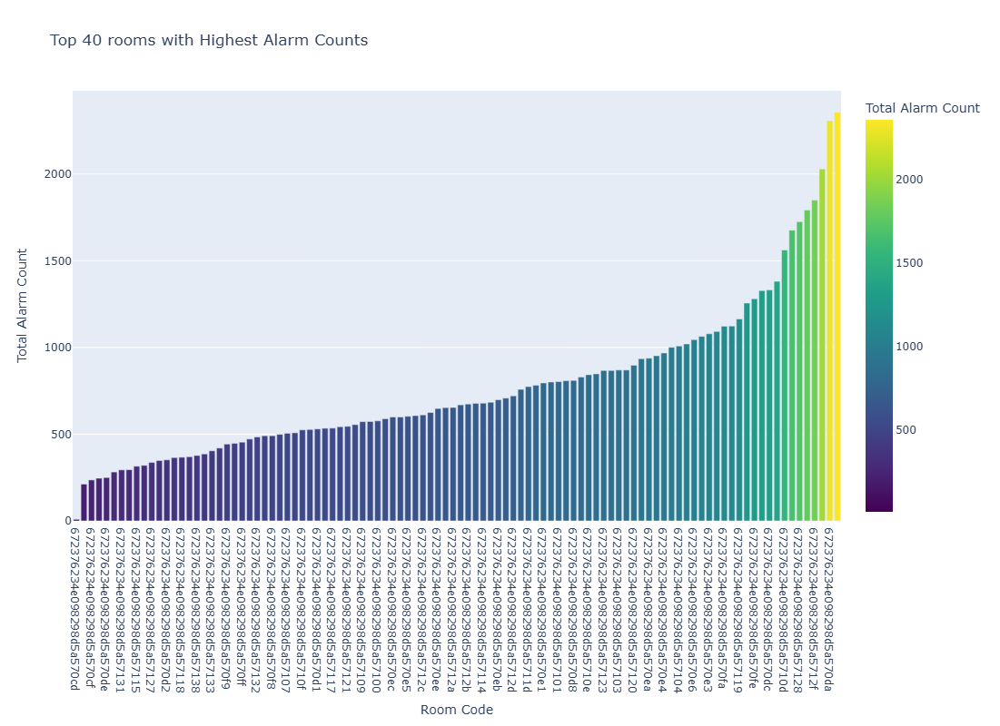

In [102]:
fig.show()

In [177]:
df_cleaned = df.iloc[3:, :].copy()
df_cleaned.columns = df.iloc[2, :].tolist()
df_cleaned = df_cleaned.rename(columns={df_cleaned.columns[1]: "Room_Code"})
df_cleaned = df_cleaned.iloc[:, 1:].reset_index(drop=True)

In [179]:
for col in df_cleaned.columns[1:]:
    df_cleaned[col] = pd.to_numeric(df_cleaned[col], errors="coerce")

In [181]:
df_cleaned["Total_Alarms"] = df_cleaned.iloc[:, 1:].sum(axis=1)

In [183]:
top_20_rooms = df_cleaned[["Room_Code", "Total_Alarms"]].dropna().nlargest(20, "Total_Alarms")

In [185]:
top_20_rooms.columns = top_20_rooms.columns.astype(str)

In [187]:
top_20_rooms = top_20_rooms.sort_values(by="Total_Alarms", ascending=True)

In [191]:
fig = px.bar(top_20_rooms, x="Room_Code", y="Total_Alarms",
            title="Top 20 rooms with Highest Alarm Counts", 
            labels={"Room_Code": "Room Code", "Total_Alarms": "Total Alarm Count"},
            color="Total_Alarms", 
            color_continuous_scale="Reds", 
            height=800,
            width=1200)

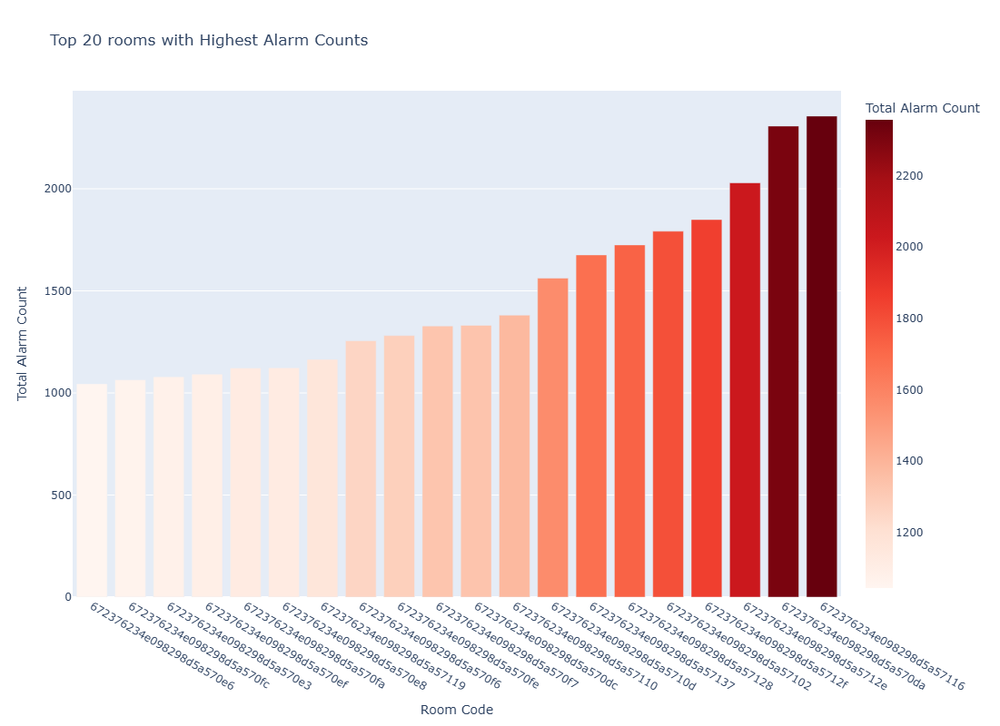

In [193]:
fig.show()

In [141]:
df_cleaned = df.iloc[3:, :].copy()
df_cleaned.columns = df.iloc[2, :].tolist()
df_cleaned = df_cleaned.rename(columns={df_cleaned.columns[1]: "Room_Code"})
df_cleaned = df_cleaned.iloc[:, 1:].reset_index(drop=True)

In [145]:
df_cleaned["Alarm_Std_Dev"] = df_cleaned.iloc[:, 1:].std(axis=1, skipna=True)

In [147]:
df_fluctuating = df_cleaned[df_cleaned["Alarm_Std_Dev"] > 20]

In [149]:
top_20_fluctuating_rooms = df_fluctuating[["Room_Code", "Alarm_Std_Dev"]].nlargest(20, "Alarm_Std_Dev")

In [151]:
top_20_fluctuating_rooms.columns = top_20_fluctuating_rooms.columns.astype(str)

In [153]:
top_20_fluctuating_rooms["Room_Code"] = top_20_fluctuating_rooms["Room_Code"].astype(str)

In [159]:
top_20_fluctuating_rooms = top_20_fluctuating_rooms.sort_values(by="Alarm_Std_Dev", ascending=True)

In [169]:
fig = px.bar(top_20_fluctuating_rooms, x="Room_Code", y="Alarm_Std_Dev", 
             title="Top 20 Fluctuating Rooms Based on Alarm Count Standard Deviation (>20)",
             labels={"Room_Code": "Room Code", "Alarm_Std_Dev": "Alarm Count Std Dev"},
             color="Alarm_Std_Dev", 
             color_continuous_scale="Purples",
             height=800,
             width=1200)

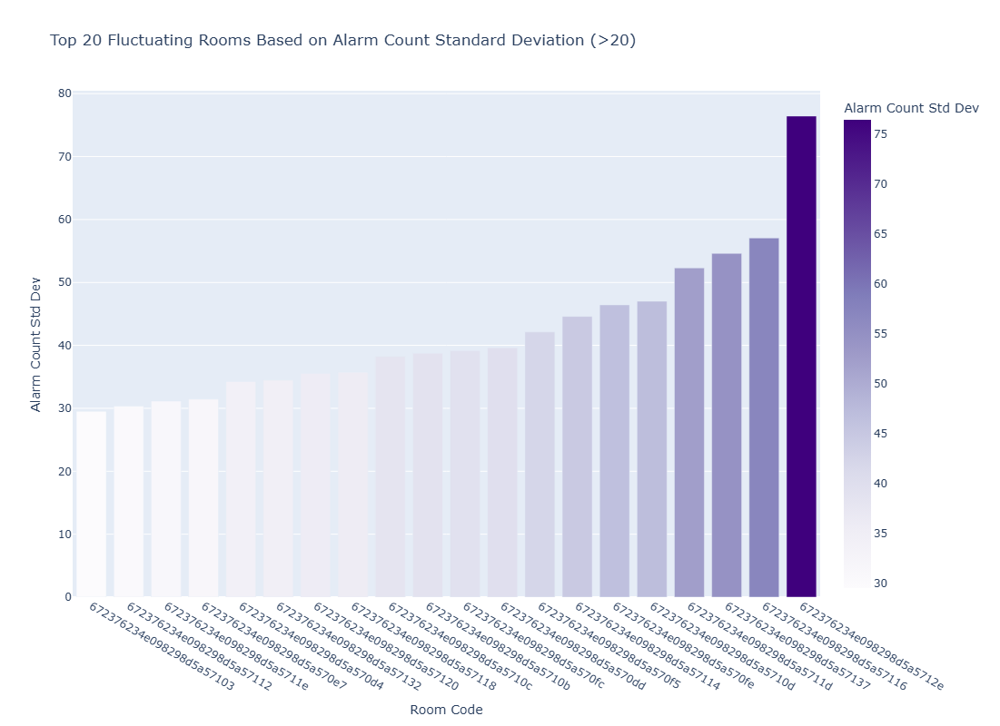

In [171]:
fig.show()

In [13]:
import pandas as pd
import numpy as np

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
%matplotlib inline

In [19]:
df = pd.read_csv("ALARMS_CLEANED.csv")

In [21]:
df.head((10))

,Unnamed: 0,Unnamed: 1,13/01/2024,14/01/2025,15/01/2025,16/01/2025,17/01/2025,18/01/2025,19/01/2025,20/01/2025,21/01/2025,22/01/2025,23/01/2025,24/01/2025,25/01/2025,26/01/2025,Unnamed: 16
0,Room_Codes,Rooms,Count_13,Count_14,Count_15,Count_16,Count_17,Count_18,Count_19,Count_20,Count_21,Count_22,Count_23,Count_24,Count_25,Count_26,NaN
1,570ca,672376234e098298d5a570ca,18,26,30,14,5,14,0,0,0,0,0,0,0,0,NaN
2,570ce,672376234e098298d5a570ce,10,31,72,29,49,19,24,53,21,26,77,5,4,13,NaN
3,570cf,672376234e098298d5a570cf,37,21,32,25,19,0,0,7,26,19,17,14,9,10,NaN
4,570d0,672376234e098298d5a570d0,51,33,29,49,8,0,10,51,54,49,60,14,36,3,NaN
5,570d1,672376234e098298d5a570d1,61,55,51,76,22,0,8,66,49,48,49,25,7,13,NaN
6,570d2,672376234e098298d5a570d2,31,25,43,9,10,0,5,70,30,23,9,38,29,30,NaN
7,570d4,672376234e098298d5a570d4,80,110,3,0,0,0,0,0,5,45,32,45,40,26,NaN
8,570d5,672376234e098298d5a570d5,36,37,18,12,13,10,24,31,34,17,18,19,28,23,NaN
9,570d8,672376234e098298d5a570d8,62,48,45,65,86,80,57,75,37,52,47,70,41,45,NaN


In [29]:
df_cleaned = df.iloc[3:, 1:].reset_index(drop=True)

In [31]:
new_columns = ["Room_Code", "Room"] + df.iloc[1, 3:].values.tolist()

In [33]:
df_cleaned.columns = df_cleaned.columns.astype(str)

In [35]:
date_columns = df_cleaned.columns[2:]
df_cleaned[date_columns] = df_cleaned[date_columns].apply(pd.to_numeric, errors="coerce")

In [37]:
median_trend = df_cleaned[date_columns].median()

In [39]:
median_trend.index = pd.to_datetime(median_trend.index, errors="coerce")

C:\Users\ObaOriekwo\AppData\Local\Temp\ipykernel_2208\3808457926.py:1: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  median_trend.index = pd.to_datetime(median_trend.index, errors="coerce")


In [41]:
start_date = "2025-01-13"
end_date = "2025-01-26"

In [43]:
median_trend_filtered = median_trend[(median_trend.index >= start_date) & (median_trend.index <= end_date)]

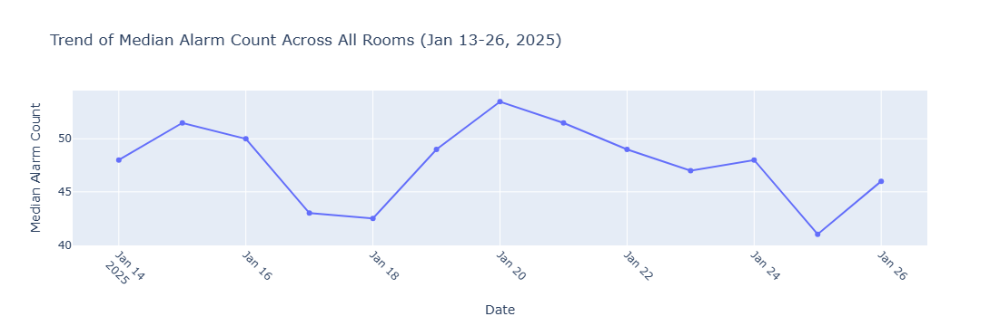

In [45]:
fig = px.line(
    x=median_trend_filtered.index, 
    y=median_trend_filtered.values, 
    labels={"x": "Date", "y": "Median Alarm Count"},
    title="Trend of Median Alarm Count Across All Rooms (Jan 13-26, 2025)"
)
fig.update_traces(mode="lines+markers")
fig.update_layout(xaxis=dict(tickangle=45), hovermode="x unified")

In [267]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

In [271]:
df = pd.read_csv('ALARMS_CLEANED.csv', skiprows=1)

In [273]:
df.head()

,Room_Codes,Rooms,Count_13,Count_14,Count_15,Count_16,Count_17,Count_18,Count_19,Count_20,Count_21,Count_22,Count_23,Count_24,Count_25,Count_26,Unnamed: 16
0,570ca,672376234e098298d5a570ca,18.0,26.0,30.0,14.0,5.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,570ce,672376234e098298d5a570ce,10.0,31.0,72.0,29.0,49.0,19.0,24.0,53.0,21.0,26.0,77.0,5.0,4.0,13.0,NaN
2,570cf,672376234e098298d5a570cf,37.0,21.0,32.0,25.0,19.0,0.0,0.0,7.0,26.0,19.0,17.0,14.0,9.0,10.0,NaN
3,570d0,672376234e098298d5a570d0,51.0,33.0,29.0,49.0,8.0,0.0,10.0,51.0,54.0,49.0,60.0,14.0,36.0,3.0,NaN
4,570d1,672376234e098298d5a570d1,61.0,55.0,51.0,76.0,22.0,0.0,8.0,66.0,49.0,48.0,49.0,25.0,7.0,13.0,NaN


In [314]:
counts = df.iloc[:, 2:16].values

In [316]:
room_stds = df.iloc[:, 2:16].std(axis=1)

In [318]:
std_threshold = room_stds.quantile(0.9)
stable_mask = room_stds < std_threshold
stable_counts = counts[stable_mask]

In [320]:
avg_with_zeros = stable_counts.mean(axis=0)
avg_without_zeros = [row[row > 0].mean() for row in stable_counts.T]

In [344]:
days = [
    'Sat (13/1)', 'Sun (14/1)', 'Mon (15/1)', 'Tue (16/1)', 
    'Wed (17/1)', 'Thu (18/1)', 'Fri (19/1)', 'Sat (20/1)', 
    'Sun (21/1)', 'Mon (22/1)', 'Tue (23/1)', 'Wed (24/1)', 
    'Thu (25/1)', 'Fri (26/1)'
]

In [346]:
fig = go.Figure()

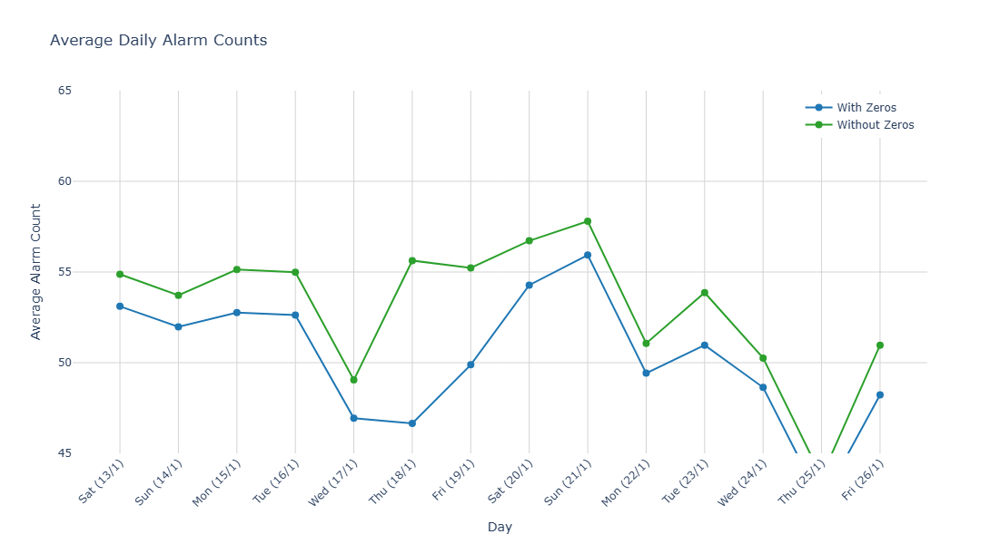

In [348]:
fig.add_trace(
    go.Scatter(
        x=days,
        y=avg_with_zeros,
        name='With Zeros',
        mode='lines+markers',
        line=dict(color='#1f77b4', width=2),
        marker=dict(size=8),
        hovertemplate='%{x}<br>Average: %{y:.1f}<extra></extra>'
    )
)

fig.add_trace(
    go.Scatter(
        x=days,
        y=avg_without_zeros,
        name='Without Zeros',
        mode='lines+markers',
        line=dict(color='#2ca02c', width=2),
        marker=dict(size=8),
        hovertemplate='%{x}<br>Average: %{y:.1f}<extra></extra>'
    )
)

# Update layout
fig.update_layout(
    title='Average Daily Alarm Counts',
    xaxis_title='Day',
    yaxis_title='Average Alarm Count',
    plot_bgcolor='white',
    yaxis=dict(
        range=[45, 65],  
        gridcolor='lightgray',
        zerolinecolor='lightgray',
    ),
    xaxis=dict(
        tickangle=-45,
        gridcolor='lightgray',
        zerolinecolor='lightgray',
    ),
    showlegend=True,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
    hovermode='x unified',
    margin=dict(b=100),  
    width=1000,
    height=600
)

# Update axes to show grid
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

# Show the figure
fig.show()

In [370]:
counts = df.iloc[:, 2:16]

In [372]:
active_rooms = counts[counts.eq(0).sum(axis=1) <= 1]

In [374]:
daily_averages = active_rooms.mean()

In [376]:
days = [
    'Sat (13/1)', 'Sun (14/1)', 'Mon (15/1)', 'Tue (16/1)', 
    'Wed (17/1)', 'Thu (18/1)', 'Fri (19/1)', 'Sat (20/1)', 
    'Sun (21/1)', 'Mon (22/1)', 'Tue (23/1)', 'Wed (24/1)', 
    'Thu (25/1)', 'Fri (26/1)'
]

In [378]:
fig = go.Figure()

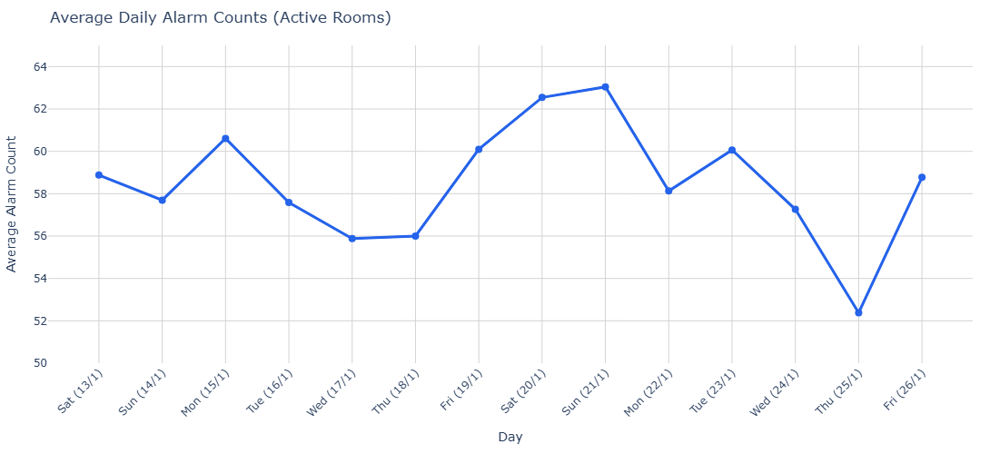

In [382]:
fig.add_trace(
    go.Scatter(
        x=days,
        y=daily_averages,
        mode='lines+markers',
        name='Average Alarms',
        line=dict(color='#2563eb', width=2),
        marker=dict(size=6)
    )
)

# Update layout
fig.update_layout(
    title='Average Daily Alarm Counts (Active Rooms)',
    xaxis_title='Day',
    yaxis_title='Average Alarm Count',
    plot_bgcolor='white',
    width=800,  
    height=500, 
    margin=dict(
        l=50,   
        r=30,   
        b=100,  
        t=50    
    ),
    showlegend=False,  
    yaxis=dict(
        range=[50, 65],
        gridcolor='lightgray'
    ),
    xaxis=dict(
        tickangle=-45,
        gridcolor='lightgray'
    )
)


fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')


fig.show()


In [384]:
counts = df.iloc[:, 2:16]

In [386]:
room_stds = counts.std(axis=1)

In [388]:
std_threshold = room_stds.quantile(0.9)
stable_rooms = counts[room_stds < std_threshold]

In [390]:
avg_with_zeros = stable_rooms.mean()
avg_without_zeros = stable_rooms.apply(lambda x: x[x > 0].mean())

In [392]:
days = [
    'Sat (13/1)', 'Sun (14/1)', 'Mon (15/1)', 'Tue (16/1)', 
    'Wed (17/1)', 'Thu (18/1)', 'Fri (19/1)', 'Sat (20/1)', 
    'Sun (21/1)', 'Mon (22/1)', 'Tue (23/1)', 'Wed (24/1)', 
    'Thu (25/1)', 'Fri (26/1)'
]

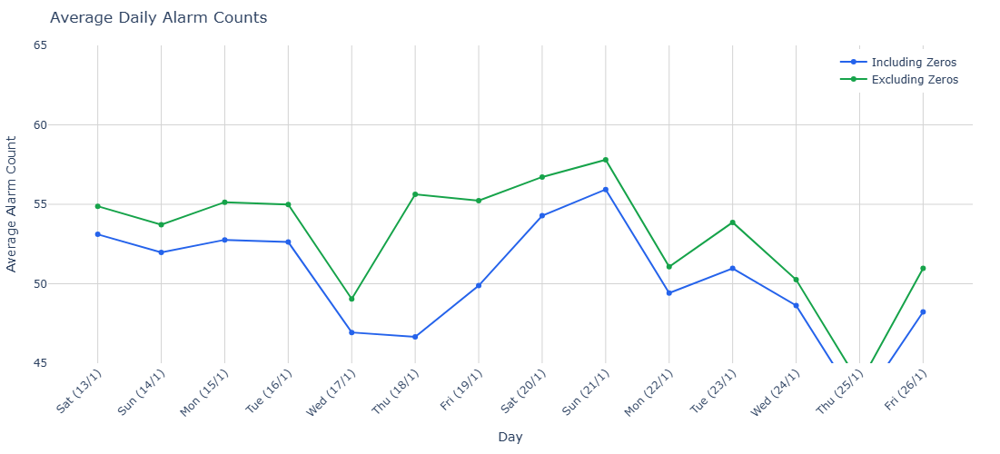

In [394]:
fig = go.Figure()


fig.add_trace(
    go.Scatter(
        x=days,
        y=avg_with_zeros,
        name='Including Zeros',
        mode='lines+markers',
        line=dict(color='#2563eb', width=2),
        marker=dict(size=6)
    )
)

fig.add_trace(
    go.Scatter(
        x=days,
        y=avg_without_zeros,
        name='Excluding Zeros',
        mode='lines+markers',
        line=dict(color='#16a34a', width=2),
        marker=dict(size=6)
    )
)


fig.update_layout(
    title='Average Daily Alarm Counts',
    xaxis_title='Day',
    yaxis_title='Average Alarm Count',
    plot_bgcolor='white',
    width=800,
    height=500,
    margin=dict(
        l=50,
        r=30,
        b=100,
        t=50
    ),
    yaxis=dict(
        range=[45, 65],
        gridcolor='lightgray',
        zerolinecolor='lightgray'
    ),
    xaxis=dict(
        tickangle=-45,
        gridcolor='lightgray',
        zerolinecolor='lightgray'
    ),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
    hovermode='x unified'
)


fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')


fig.show()

In [408]:
df = pd.read_csv('ALARMS_CLEANED.csv', skiprows=1)
counts = df.iloc[:, 2:16]
room_codes = df.iloc[:, 0]

In [412]:
total_alarms = counts.sum(axis=1)
room_totals = pd.DataFrame({
    'Room': room_codes,
    'Total': total_alarms
})

In [414]:
top_40 = room_totals.nlargest(40, 'Total')

In [416]:
fig = go.Figure()

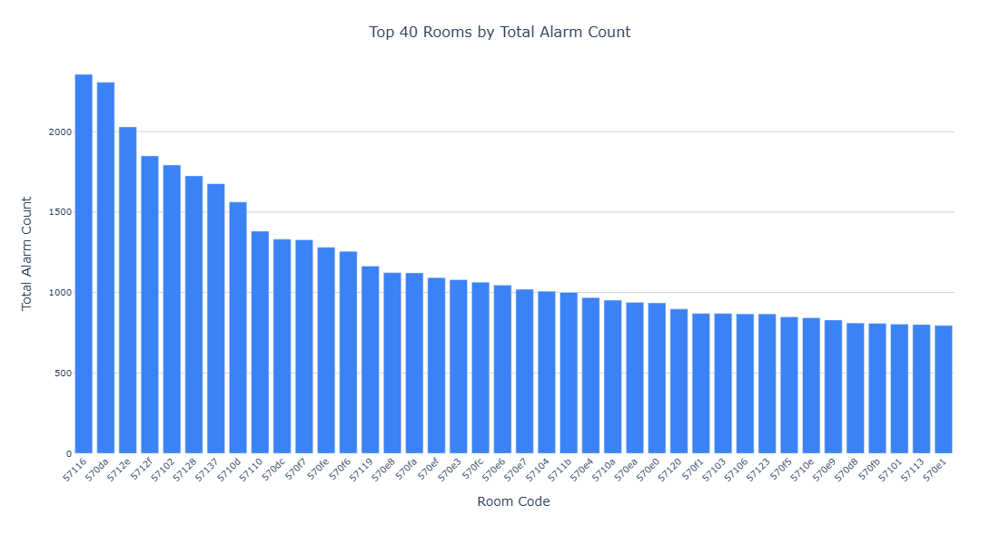

In [418]:
fig.add_trace(
    go.Bar(
        x=top_40['Room'],
        y=top_40['Total'],
        marker_color='#3b82f6',
        hovertemplate='Room: %{x}<br>Total Alarms: %{y}<extra></extra>'
    )
)

# Update layout
fig.update_layout(
    title={
        'text': 'Top 40 Rooms by Total Alarm Count',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=16)
    },
    xaxis_title='Room Code',
    yaxis_title='Total Alarm Count',
    plot_bgcolor='white',
    width=900,
    height=600,
    margin=dict(
        l=80,
        r=50,
        b=100,
        t=60
    ),
    xaxis=dict(
        tickangle=-45,
        gridcolor='lightgray',
        tickfont=dict(size=10),
        showgrid=False
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=10),
        showgrid=True
    ),
    showlegend=False,
    hovermode='x'
)

# Update axes
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

# Show figure
fig.show()


In [420]:
df = pd.read_csv('ALARMS_CLEANED.csv', skiprows=1)
counts = df.iloc[:, 2:16] 
room_codes = df.iloc[:, 0]

In [422]:
room_stds = counts.std(axis=1)

In [428]:
high_std_rooms = room_stds[room_stds > 20]
high_std_rooms = pd.DataFrame({
    'Room': room_codes[high_std_rooms.index],
    'Standard_Deviation': room_stds[high_std_rooms.index]
})

In [430]:
top_20 = high_std_rooms.nlargest(20, 'Standard_Deviation')

In [432]:
fig = go.Figure()

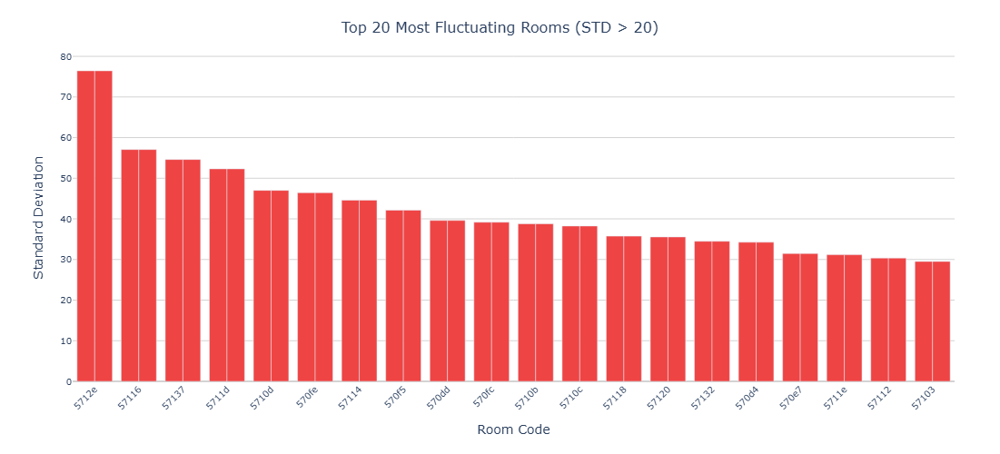

In [436]:
fig.add_trace(
    go.Bar(
        x=top_20['Room'],
        y=top_20['Standard_Deviation'],
        marker_color='#ef4444',  # Red color for fluctuation
        hovertemplate='Room: %{x}<br>Standard Deviation: %{y:.1f}<extra></extra>'
    )
)

# Update layout
fig.update_layout(
    title={
        'text': 'Top 20 Most Fluctuating Rooms (STD > 20)',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=16)
    },
    xaxis_title='Room Code',
    yaxis_title='Standard Deviation',
    plot_bgcolor='white',
    width=800,
    height=500,
    margin=dict(
        l=80,    # left margin
        r=50,    # right margin
        b=80,    # bottom margin
        t=60     # top margin
    ),
    xaxis=dict(
        tickangle=-45,
        tickfont=dict(size=10),
        showgrid=False
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=10),
        showgrid=True,
        zeroline=True,
        zerolinecolor='lightgray'
    ),
    showlegend=False,
    bargap=0.2
)

# Update y-axis grid
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

# Show figure
fig.show()


In [442]:
df = pd.read_csv('ALARMS_CLEANED.csv', skiprows=1)
counts = df.iloc[:, 2:16]  # Get count columns
room_codes = df.iloc[:, 0]

In [444]:
room_averages = counts.mean(axis=1)
room_data = pd.DataFrame({
    'Room': room_codes,
    'Average': room_averages
})

In [446]:
room_data_sorted = room_data.sort_values('Average', ascending=False)

In [448]:
fig = go.Figure()

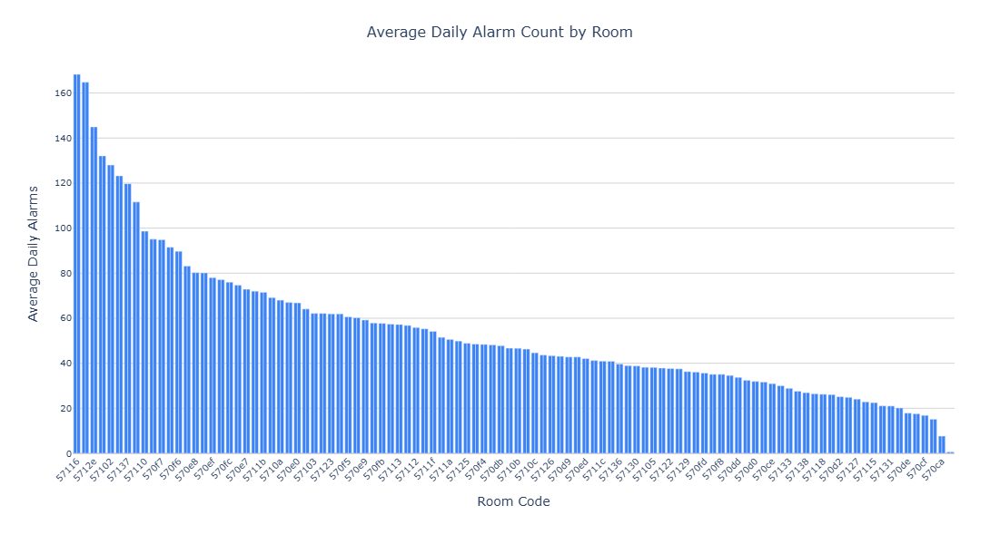

In [452]:
fig.add_trace(
    go.Bar(
        x=room_data_sorted['Room'],
        y=room_data_sorted['Average'],
        marker_color='#3b82f6',
        hovertemplate='Room: %{x}<br>Average Alarms: %{y:.1f}<extra></extra>'
    )
)


fig.update_layout(
    title={
        'text': 'Average Daily Alarm Count by Room',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=16)
    },
    xaxis_title='Room Code',
    yaxis_title='Average Daily Alarms',
    plot_bgcolor='white',
    width=1000,
    height=600,
    margin=dict(
        l=80,
        r=50,
        b=100,
        t=60
    ),
    xaxis=dict(
        tickangle=-45,
        tickfont=dict(size=10),
        showgrid=False,
        title_font=dict(size=12)
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=10),
        showgrid=True,
        title_font=dict(size=12),
        zeroline=True,
        zerolinecolor='lightgray'
    ),
    showlegend=False,
    bargap=0.2
)
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

# Show figure
fig.show()


In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [4]:
df = pd.read_csv("ALARMS_CLEANED.csv")

In [6]:
df.head((60))

,Unnamed: 0,Unnamed: 1,13/01/2024,14/01/2025,15/01/2025,16/01/2025,17/01/2025,18/01/2025,19/01/2025,20/01/2025,21/01/2025,22/01/2025,23/01/2025,24/01/2025,25/01/2025,26/01/2025,Unnamed: 16
0,Room_Codes,Rooms,Count_13,Count_14,Count_15,Count_16,Count_17,Count_18,Count_19,Count_20,Count_21,Count_22,Count_23,Count_24,Count_25,Count_26,NaN
1,570ca,672376234e098298d5a570ca,18,26,30,14,5,14,0,0,0,0,0,0,0,0,NaN
2,570ce,672376234e098298d5a570ce,10,31,72,29,49,19,24,53,21,26,77,5,4,13,NaN
3,570cf,672376234e098298d5a570cf,37,21,32,25,19,0,0,7,26,19,17,14,9,10,NaN
4,570d0,672376234e098298d5a570d0,51,33,29,49,8,0,10,51,54,49,60,14,36,3,NaN
5,570d1,672376234e098298d5a570d1,61,55,51,76,22,0,8,66,49,48,49,25,7,13,NaN
6,570d2,672376234e098298d5a570d2,31,25,43,9,10,0,5,70,30,23,9,38,29,30,NaN
7,570d4,672376234e098298d5a570d4,80,110,3,0,0,0,0,0,5,45,32,45,40,26,NaN
8,570d5,672376234e098298d5a570d5,36,37,18,12,13,10,24,31,34,17,18,19,28,23,NaN
9,570d8,672376234e098298d5a570d8,62,48,45,65,86,80,57,75,37,52,47,70,41,45,NaN
